In [155]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression
from scipy.ndimage import gaussian_filter1d
from pandas import DataFrame, Series
import matplotlib.pylab as plt
import seaborn as sns 
import pandas as pd
import numpy as np
import datetime
import pyproj 
import random
import os
import io

%matplotlib inline
np.set_printoptions(precision=3 , suppress= True)

In [156]:
#initial parameters - path
folder_path = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files'
file_path = os.path.join(folder_path, 'EGMS_L3_E44N25_100km_U.csv')
teste = pd.read_csv(file_path)

teste_reduced = teste.iloc[:,list(range(1, 4)) + list(range(11, 375))]
print(teste_reduced)

        easting  northing  height  20160105  20160111  20160117  20160123  \
0       4499150   2596450  2186.4       3.2       5.2       3.7       1.6   
1       4499350   2596550  2060.1       4.3       2.8       2.5       2.9   
2       4499150   2596550  2112.4      -2.2      -2.0      -1.5      -2.1   
3       4498950   2596550  2075.7      -1.2      -1.7      -1.4      -0.9   
4       4498850   2596550  2024.0       1.4       1.7      -1.9      -2.3   
...         ...       ...     ...       ...       ...       ...       ...   
209839  4415850   2516650   565.8      -1.0      -0.2       0.0       0.8   
209840  4415950   2516650   563.0       1.0       0.5       0.5       0.9   
209841  4416050   2516650   551.3       0.8       1.4       1.2      -0.2   
209842  4416150   2516650   537.0      -1.5      -3.2      -3.1       1.0   
209843  4416250   2516750   535.2      -3.2      -1.8      -1.2       0.1   

        20160129  20160204  20160210  ...  20211029  20211104  20211110  \


In [157]:
#define the ETRS89-LAEA and the UTM projection
etrs89_laea = pyproj.CRS("EPSG:3035")
wgs84 = pyproj.CRS("EPSG:4326")
utm_32 = pyproj.CRS("EPSG:23032")

In [59]:
teste_new = teste_reduced.copy()

transformer = pyproj.Transformer.from_crs(etrs89_laea, wgs84)
teste_new["latitude"], teste_new["longitude"] = transformer.transform(teste_new["northing"].to_numpy(), teste_new["easting"].to_numpy())

print(teste_new)

        easting  northing  height  20160105  20160111  20160117  20160123  \
0       4499150   2596450  2186.4       3.2       5.2       3.7       1.6   
1       4499350   2596550  2060.1       4.3       2.8       2.5       2.9   
2       4499150   2596550  2112.4      -2.2      -2.0      -1.5      -2.1   
3       4498950   2596550  2075.7      -1.2      -1.7      -1.4      -0.9   
4       4498850   2596550  2024.0       1.4       1.7      -1.9      -2.3   
...         ...       ...     ...       ...       ...       ...       ...   
209839  4415850   2516650   565.8      -1.0      -0.2       0.0       0.8   
209840  4415950   2516650   563.0       1.0       0.5       0.5       0.9   
209841  4416050   2516650   551.3       0.8       1.4       1.2      -0.2   
209842  4416150   2516650   537.0      -1.5      -3.2      -3.1       1.0   
209843  4416250   2516750   535.2      -3.2      -1.8      -1.2       0.1   

        20160129  20160204  20160210  ...  20211110  20211116  20211122  \


In [158]:
latitude_min = 45.700
latitude_max = 46.900
longitude_min = 12.100
longitude_max = 12.300

teste_area_selected = teste_new[((teste_new['latitude'] > latitude_min) & (teste_new['latitude'] < latitude_max) &
                  (teste_new['longitude'] > longitude_min) & (teste_new['longitude'] < longitude_max))]

print(teste_area_selected)

       easting  northing  height  20160105  20160111  20160117  20160123  \
259    4498350   2575750   525.1       0.7       0.8       0.4       0.6   
261    4498350   2575850   528.4       1.2       1.3       1.4       1.7   
262    4498450   2575850   501.7       0.5       0.1       0.1       0.1   
266    4498350   2575950   514.3       0.8       0.4       0.6       0.8   
268    4498450   2575950   494.6       0.9       1.3       0.6       0.2   
...        ...       ...     ...       ...       ...       ...       ...   
73304  4484050   2578950  1685.6       0.5       0.2      -0.1      -0.2   
73305  4483150   2578950  1570.4      -1.4      -1.2      -0.7      -0.6   
73306  4484250   2578950  1716.6       0.3      -0.3       0.0       0.5   
73307  4484150   2578950  1697.4       2.7       1.9       1.5       0.8   
73308  4483250   2578950  1587.8      -0.8      -0.8      -0.1      -0.1   

       20160129  20160204  20160210  ...  20211110  20211116  20211122  \
259         0

In [166]:
def selec_points(teste_area_selected, indice_number):
    teste_point = teste_area_selected.iloc[indice_number, 3:367]
    teste_point.index = pd.to_datetime(teste_point.index, format='%Y%m%d')
    points_dataframe = pd.DataFrame(teste_point, columns=[teste_point.name])
    return points_dataframe
    
num_points = 100
indicies = random.choices(range(len(teste_area_selected)), k = num_points)
points_dictionaire = {}
    
for indice_number in indicies:
    points_dataframe = selec_points(teste_area_selected, indice_number)
    points_dictionaire[indice_number] = points_dataframe

print(points_dictionaire)

{22404:             33829
2016-01-05    1.8
2016-01-11    2.2
2016-01-17    2.7
2016-01-23    1.7
2016-01-29   -0.2
...           ...
2021-11-28   -8.7
2021-12-04   -7.8
2021-12-10  -12.2
2021-12-16   -7.6
2021-12-22   -7.1

[364 rows x 1 columns], 24277:             35706
2016-01-05    1.3
2016-01-11    1.0
2016-01-17    0.9
2016-01-23    0.7
2016-01-29    0.1
...           ...
2021-11-28   -8.7
2021-12-04   -8.9
2021-12-10   -8.4
2021-12-16   -9.0
2021-12-22   -7.8

[364 rows x 1 columns], 13188:             19519
2016-01-05   -0.6
2016-01-11   -0.4
2016-01-17   -0.3
2016-01-23   -0.2
2016-01-29   -0.3
...           ...
2021-11-28   -4.3
2021-12-04   -4.1
2021-12-10   -4.6
2021-12-16   -4.6
2021-12-22   -4.5

[364 rows x 1 columns], 18843:             30268
2016-01-05   -0.3
2016-01-11   -0.3
2016-01-17   -0.3
2016-01-23   -0.2
2016-01-29   -0.1
...           ...
2021-11-28   -2.6
2021-12-04   -3.3
2021-12-10   -3.1
2021-12-16   -3.0
2021-12-22   -3.3

[364 rows x 1 columns], 30492: 

In [167]:
print(indicies)

[22404, 24277, 13188, 18843, 30492, 9049, 5337, 27924, 10232, 4206, 18576, 7707, 21565, 2933, 2925, 21386, 24907, 16101, 537, 10953, 21458, 31638, 9122, 10064, 17618, 4279, 20804, 28321, 1446, 7307, 23350, 13713, 16494, 26419, 24455, 9816, 25824, 27374, 11701, 2865, 21749, 12322, 24642, 11032, 8589, 23135, 27585, 24533, 19469, 3808, 16094, 4662, 4380, 9098, 5059, 20436, 11096, 28198, 4920, 6249, 22528, 7460, 27593, 8724, 31352, 14403, 16969, 12323, 990, 29826, 20903, 2172, 1874, 19690, 1996, 29414, 13562, 9277, 21642, 31660, 19833, 28403, 22077, 12469, 30858, 17934, 2504, 22196, 877, 18618, 1095, 3132, 25326, 21078, 408, 51, 17361, 5497, 12824, 28917]


In [169]:
def linear_detrend(column_name, indice_data):
 
    #getting the linear model to substract from the original time series:    
    x = np.arange(len(indice_data)).reshape(-1, 1)
    y = indice_data.values.reshape(-1, 1)
    
    linear_model = LinearRegression().fit(x, y)
    regression_line = linear_model.predict(x)
    
    detrended_values = y.flatten() - regression_line.flatten()
    #detrended_values = station_data[f'{station_name}_east(m)'].values - regression_line.flatten()
    
    detrended_dataframe = pd.DataFrame(
        detrended_values, 
        index=indice_data.index, 
        columns=[f'{column_name}_up(mm)_detrended'])
        
    return detrended_dataframe


#dictionaries to store the data
detrended_data_dict = {}

#calling the function
for indice_number, indice_data in points_dictionaire.items():
    
    column_name = indice_data.columns[0]
    detrended_dataframe = linear_detrend(
        column_name, 
        indice_data)
    detrended_data_dict[column_name] = detrended_dataframe
    

#printing dataframe
#stations detrended
for indice_number, indice_data in detrended_data_dict.items():
    print(f'{indice_number}: \n{indice_data}\n')

33829: 
            33829_up(mm)_detrended
2016-01-05                0.011304
2016-01-11                0.436144
2016-01-17                0.960984
2016-01-23               -0.014176
2016-01-29               -1.889336
...                            ...
2021-11-28               -1.571104
2021-12-04               -0.646263
2021-12-10               -5.021423
2021-12-16               -0.396583
2021-12-22                0.128257

[364 rows x 1 columns]

35706: 
            35706_up(mm)_detrended
2016-01-05               -1.036756
2016-01-11               -1.302955
2016-01-17               -1.369155
2016-01-23               -1.535354
2016-01-29               -2.101553
...                            ...
2021-11-28                1.097707
2021-12-04                0.931508
2021-12-10                1.465308
2021-12-16                0.899109
2021-12-22                2.132910

[364 rows x 1 columns]

19519: 
            19519_up(mm)_detrended
2016-01-05               -2.025413
2016-01-11      

In [170]:
def remove_outliers(indice_number, indice_data):
    limiar_z = 3.0
    
    
    selecting_outliers = indice_data[(np.abs(indice_data-indice_data.mean()) 
                                              < limiar_z*indice_data.std())]
    
    
    outliers_removed_dataframe = pd.DataFrame(selecting_outliers, 
                                              index=indice_data.index)
    
    outliers_removed_dataframe = outliers_removed_dataframe.rename(
        columns={f'{indice_number}_up(mm)_detrended':f'{indice_number}_up(mm)'})  
    
    outliers_removed_dataframe.dropna(inplace=True)
    
    return outliers_removed_dataframe

#dictionaries to store the data
area_outliers_removed_dict = {}

#calling the function
for indice_number, indice_data in detrended_data_dict.items():
    outliers_removed_dataframe = remove_outliers(
        indice_number, 
        indice_data)
    area_outliers_removed_dict[indice_number] = outliers_removed_dataframe

#printing dataframe
#stations detrended
for indice_number, indice_data in area_outliers_removed_dict.items():
    print(f'{indice_number}: \n{indice_data}\n')

33829: 
            33829_up(mm)
2016-01-05      0.011304
2016-01-11      0.436144
2016-01-17      0.960984
2016-01-23     -0.014176
2016-01-29     -1.889336
...                  ...
2021-11-28     -1.571104
2021-12-04     -0.646263
2021-12-10     -5.021423
2021-12-16     -0.396583
2021-12-22      0.128257

[362 rows x 1 columns]

35706: 
            35706_up(mm)
2016-01-05     -1.036756
2016-01-11     -1.302955
2016-01-17     -1.369155
2016-01-23     -1.535354
2016-01-29     -2.101553
...                  ...
2021-11-28      1.097707
2021-12-04      0.931508
2021-12-10      1.465308
2021-12-16      0.899109
2021-12-22      2.132910

[363 rows x 1 columns]

19519: 
            19519_up(mm)
2016-01-11     -1.811016
2016-01-17     -1.696619
2016-01-23     -1.582222
2016-01-29     -1.667825
2016-02-04     -1.753428
...                  ...
2021-11-28     -0.556900
2021-12-04     -0.342503
2021-12-10     -0.828106
2021-12-16     -0.813709
2021-12-22     -0.699312

[362 rows x 1 columns]

3

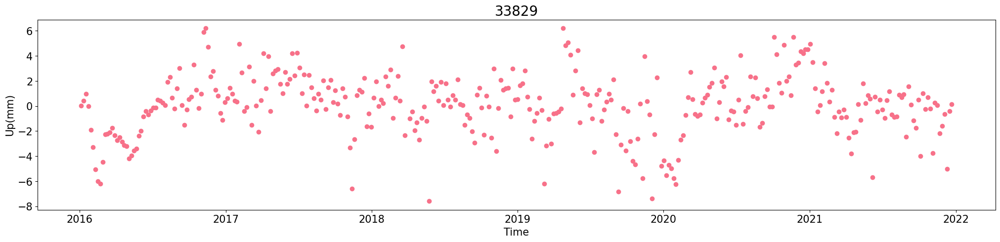

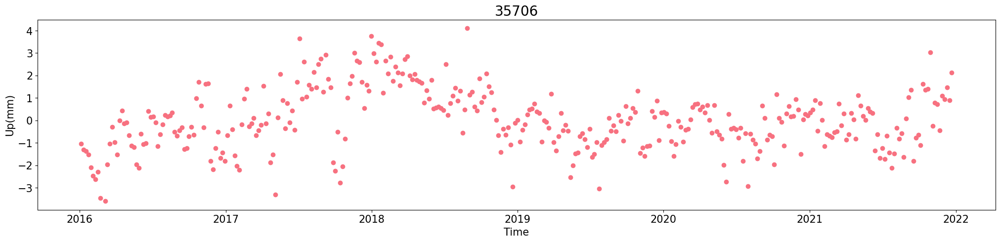

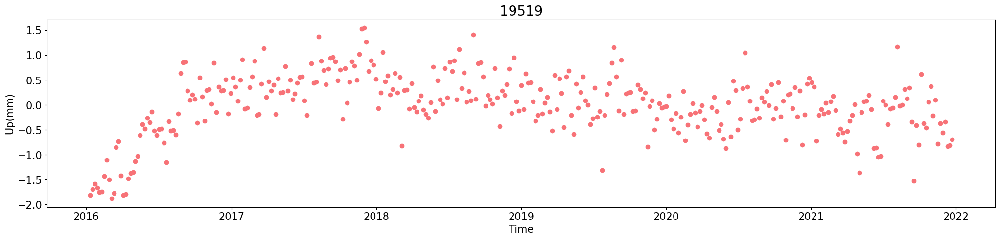

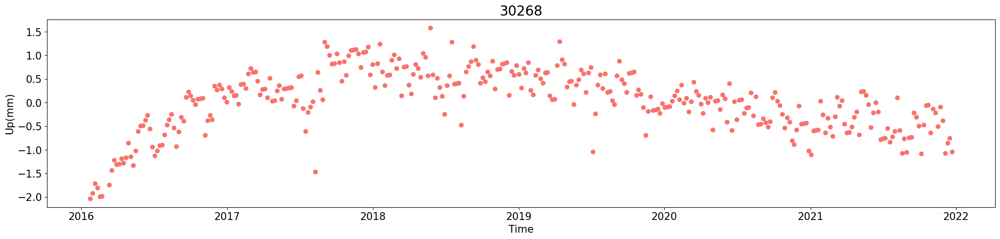

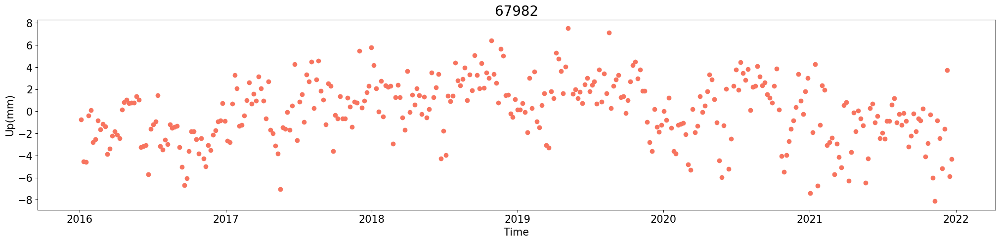

...

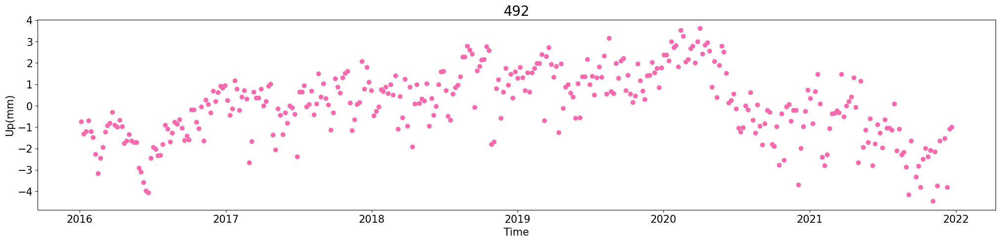

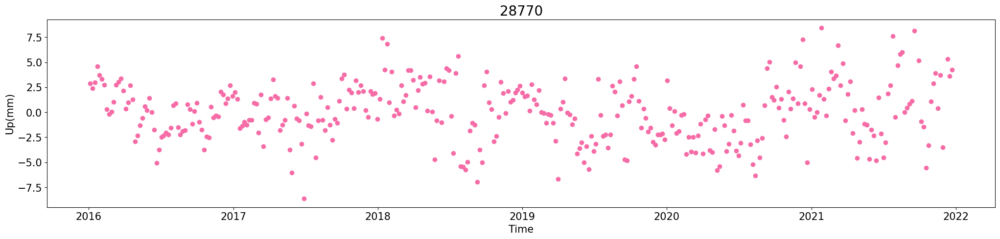

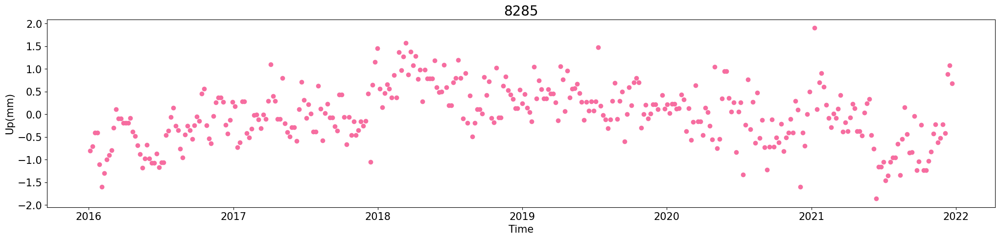

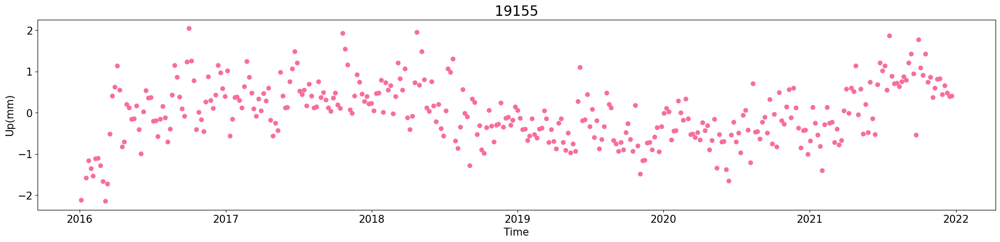

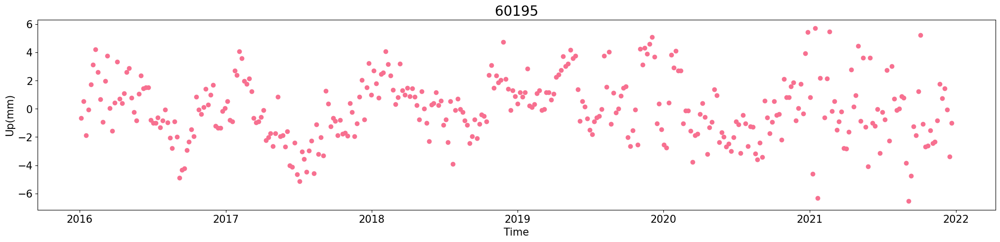

In [171]:
#checking the areas's plots - brse detrended

colors = sns.color_palette("husl", len(area_outliers_removed_dict))
#folder = ''

for i, (indice_number, indice_data) in enumerate(area_outliers_removed_dict.items()):
    plt.figure(figsize=(25, 5))
    
    plt.plot(indice_data.index, indice_data, 'o', color = colors[i])
    plt.title(f'{indice_number}', fontsize = 20)
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize=15)
    plt.ylabel('Up(mm)', fontsize = 15)
    plt.yticks(fontsize=15)
    #plt.ylim(-0.008,0.008)
   
    #fl = os.path.join(folder, f'{indice_number}.svg')
    #f = io.BytesIO()
    #plt.savefig(fl, format="svg")

    plt.show()

In [174]:
def get_rolling_mean(indice_number, indice_data):
    
    area_rolling_mean = indice_data.rolling(2, min_periods=1).mean()
    
    areas_rolling_mean_dataframe = pd.DataFrame(area_rolling_mean, 
                                              index=indice_data.index)
    
    areas_rolling_mean_dataframe = areas_rolling_mean_dataframe.rename(
        columns={f'{indice_number}_up(mm)':f'{indice_number}_up(mm)_rm'})
    
    areas_rolling_mean_dataframe.dropna(inplace=True)
    
    return areas_rolling_mean_dataframe

#dictionaries to store the data
areas_rolling_mean_dict = {}

#calling the function
for indice_number, indice_data in area_outliers_removed_dict.items():
    areas_rolling_mean_dataframe = get_rolling_mean(indice_number, indice_data)
    areas_rolling_mean_dict[indice_number] = areas_rolling_mean_dataframe

#printing dataframe
#stations detrended
for indice_number, indice_data in areas_rolling_mean_dict.items():
    print(f'{indice_number}: \n{indice_data}\n')

33829: 
            33829_up(mm)_rm
2016-01-05         0.011304
2016-01-11         0.223724
2016-01-17         0.698564
2016-01-23         0.473404
2016-01-29        -0.951756
...                     ...
2021-11-28        -1.883524
2021-12-04        -1.108684
2021-12-10        -2.833843
2021-12-16        -2.709003
2021-12-22        -0.134163

[362 rows x 1 columns]

35706: 
            35706_up(mm)_rm
2016-01-05        -1.036756
2016-01-11        -1.169856
2016-01-17        -1.336055
2016-01-23        -1.452254
2016-01-29        -1.818453
...                     ...
2021-11-28         0.330807
2021-12-04         1.014607
2021-12-10         1.198408
2021-12-16         1.182209
2021-12-22         1.516009

[363 rows x 1 columns]

19519: 
            19519_up(mm)_rm
2016-01-11        -1.811016
2016-01-17        -1.753818
2016-01-23        -1.639421
2016-01-29        -1.625024
2016-02-04        -1.710627
...                     ...
2021-11-28        -0.464098
2021-12-04        -0.449701
20

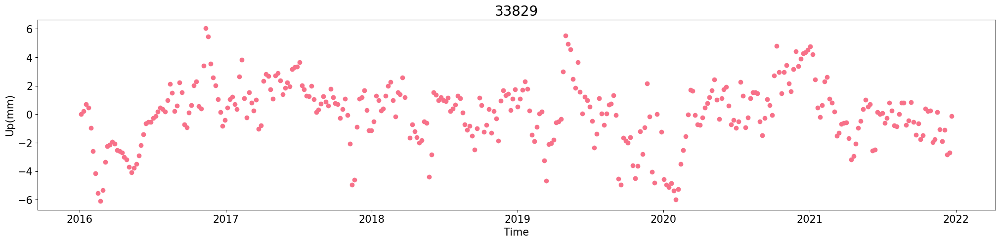

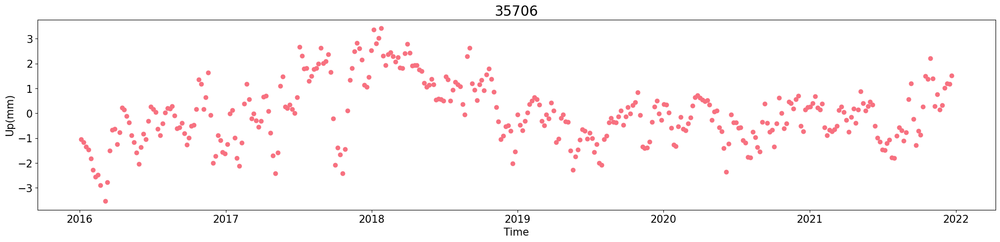

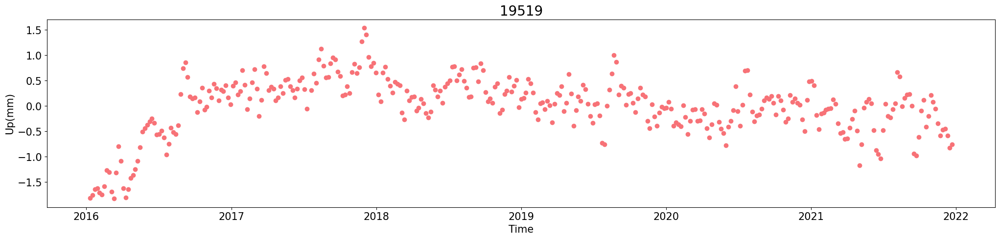

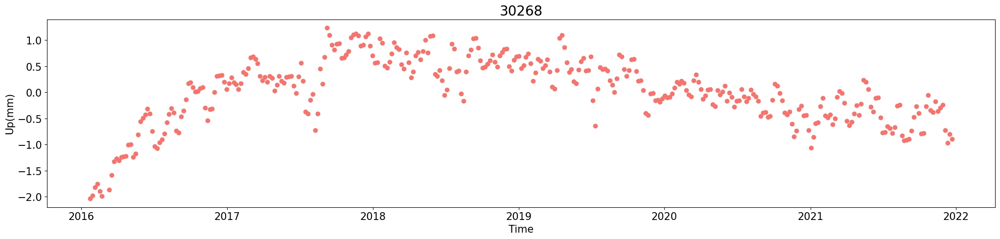

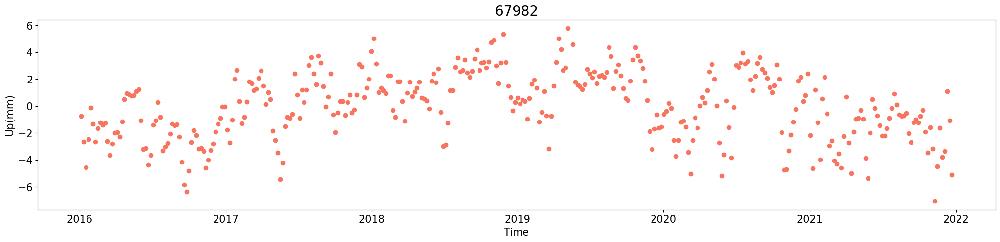

...

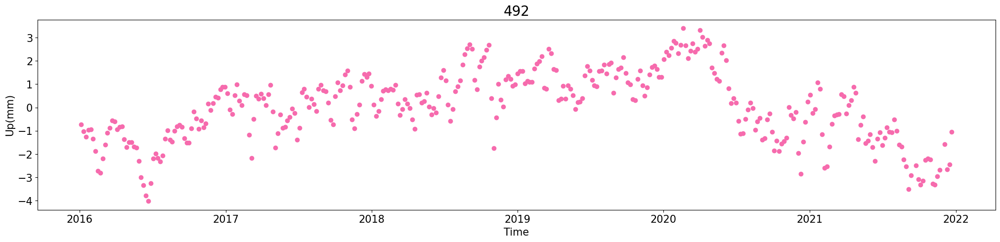

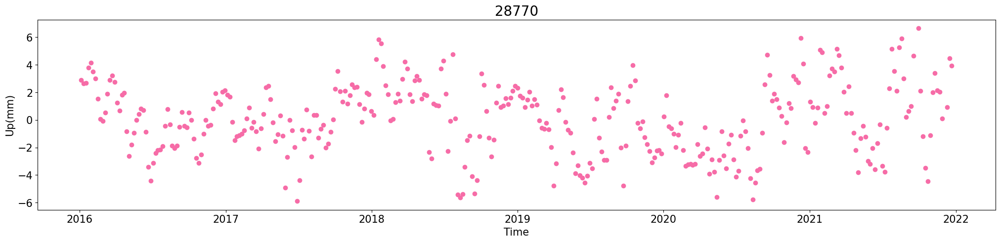

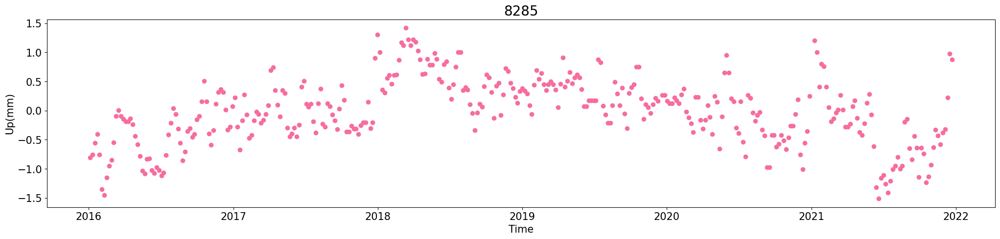

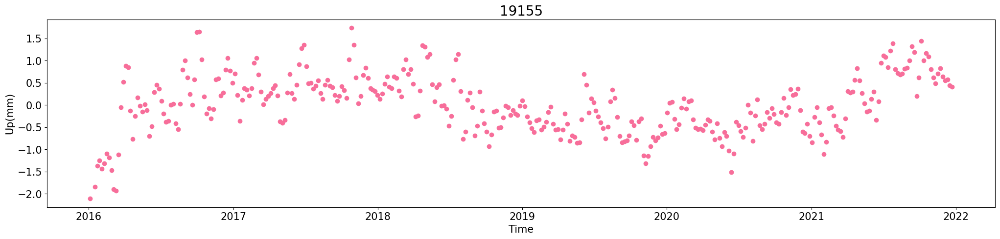

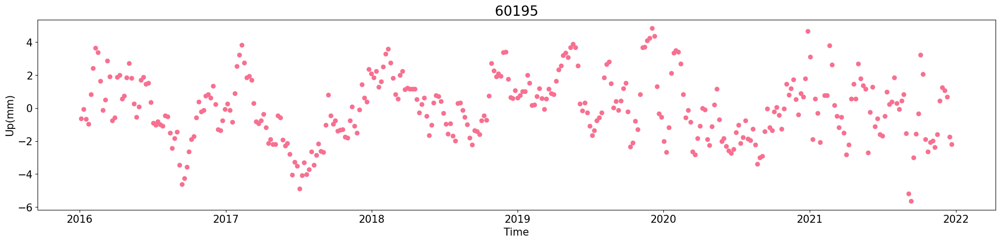

In [175]:
#checking the areas's plots - rolling mean

colors = sns.color_palette("husl", len(areas_rolling_mean_dict))
folder = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files/insar_ts_plots/points_rolling_mean/up'

for i, (indice_number, indice_data) in enumerate(areas_rolling_mean_dict.items()):
    plt.figure(figsize=(25, 5))
    
    plt.plot(indice_data.index, indice_data, 'o', color = colors[i])
    plt.title(f'{indice_number}', fontsize = 20)
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize=15)
    plt.ylabel('Up(mm)', fontsize = 15)
    plt.yticks(fontsize=15)
    #plt.ylim(-0.008,0.008)
   
    fl = os.path.join(folder, f'{indice_number}.svg')
    f = io.BytesIO()
    plt.savefig(fl, format="svg")

    plt.show()

In [85]:
#checking all point together:

#colors = sns.color_palette("husl", len(areas_rolling_mean_dict))
#folder = ''

#plt.figure(figsize=(35, 15))

#for i, (indice_number, indice_data) in enumerate(areas_rolling_mean_dict.items()):
    #plt.plot(indice_data.index, indice_data, label = f'{indice_number}', color=colors[i], lw=1.5)

#plt.title('Rolling Mean - All Points', fontsize=30)
#plt.xlabel('Time', fontsize=20)
#plt.xticks(fontsize=20)
#plt.ylabel('Up(mm)', fontsize=20)
#plt.yticks(fontsize=20)
#plt.xlim(pd.Timestamp('2011-01-15'), pd.Timestamp('2018-10-15'))
#plt.legend()

#fl = os.path.join(folder, 'rm_all_points_EAST.svg')
#plt.savefig(fl, format="svg")

#plt.show()

In [176]:
#getting the average for all points rolling mean
all_rm_data = pd.DataFrame()

for indice_number, indice_data in areas_rolling_mean_dict.items():
    all_rm_data[indice_number] = indice_data.squeeze()
    
avg_rm = all_rm_data.mean(axis=1).rolling(2, min_periods=1).mean()
print(avg_rm)

2016-01-05   -0.880729
2016-01-11   -0.867789
2016-01-17   -0.864940
2016-01-23   -0.865889
2016-01-29   -0.839278
                ...   
2021-11-28    0.450805
2021-12-04    0.409775
2021-12-10    0.265035
2021-12-16    0.171869
2021-12-22    0.203164
Length: 362, dtype: float64


In [118]:
#removing the average rolling mean from each point
points_avgrm_reduced = pd.DataFrame()

for indice_number, indice_data in areas_rolling_mean_dict.items():
    points_avgrm_reduced[indice_number] = indice_data[f'{indice_number}_up(mm)_rm'] - avg_rm
    
points_avgrm_reduced = points_avgrm_reduced.dropna(axis=0)

print(points_avgrm_reduced)

               96953     97160     97031     63406     96720     96006  \
2016-02-04 -1.316841  0.387111 -0.846217  0.098093 -0.138418 -0.148867   
2016-02-22 -3.510429 -2.313142  0.725290 -0.013670  0.337423  0.731519   
2016-03-05  0.610489 -3.530001  0.272939 -0.204869  0.837960  1.151753   
2016-03-11  2.786179 -2.123200  0.136994 -0.035238  0.703459 -0.697900   
2016-03-23 -1.756953  0.045892 -0.079407  0.109514  0.189947 -2.741715   
...              ...       ...       ...       ...       ...       ...   
2021-11-16  1.191998  0.697252 -0.282829  0.424346  0.433407 -0.010457   
2021-11-22 -0.895610  0.890756 -0.132071  1.130679  0.335608  1.376593   
2021-12-04 -2.483224  0.915364 -0.442955  1.880948  0.427613  0.888294   
2021-12-16 -0.654118  1.756694 -0.437119  0.097937  0.336338  5.666716   
2021-12-22 -2.435360  1.806564 -0.629996  1.160636  0.694906  2.710132   

               96360     96610     96180     97046  ...     96995     96601  \
2016-02-04 -0.125871  0.452257  

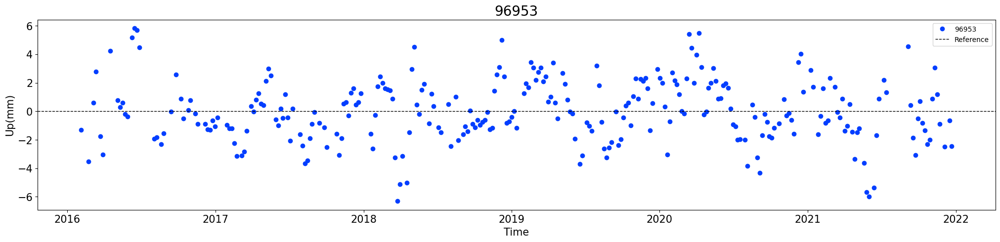

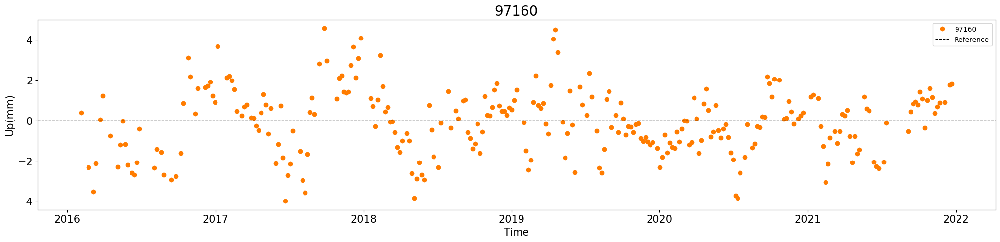

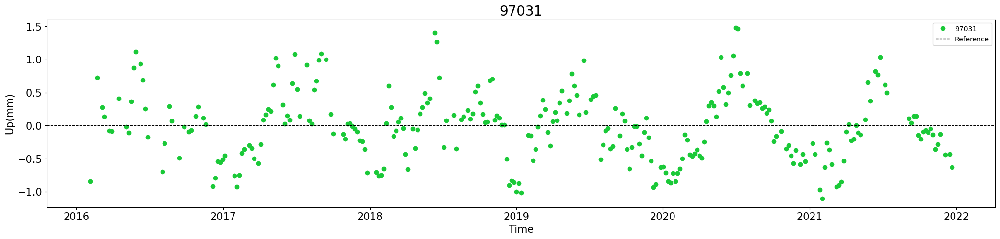

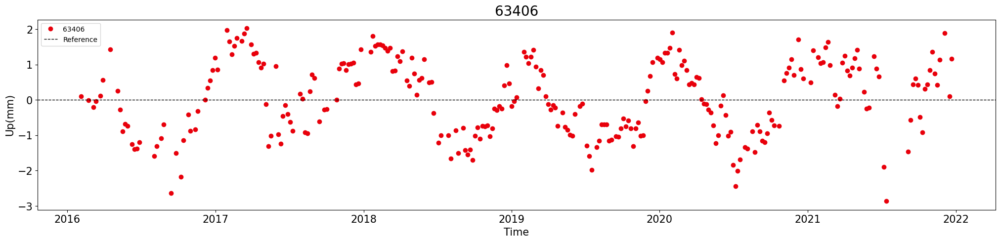

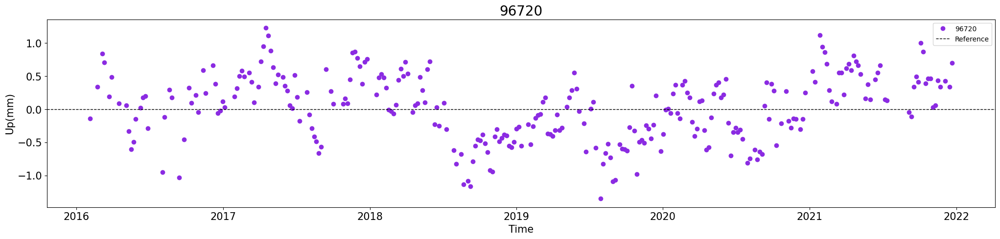

...

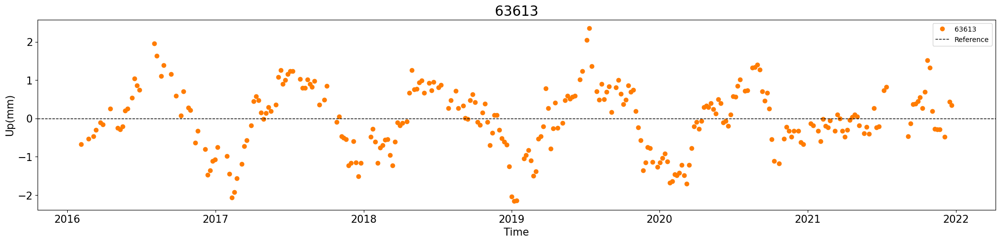

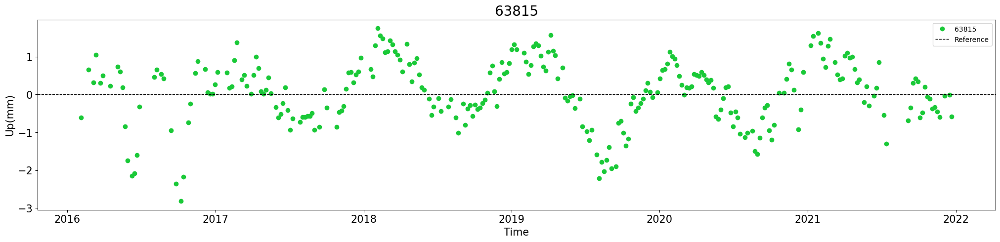

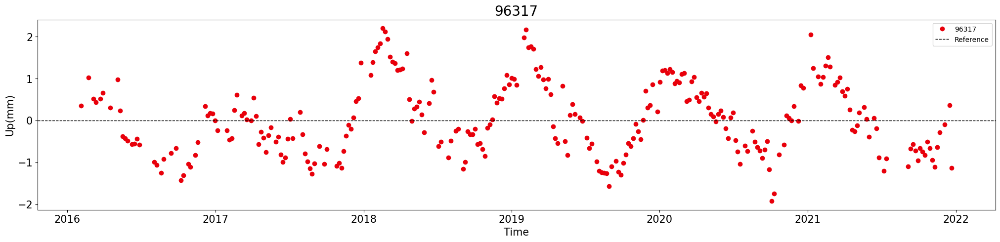

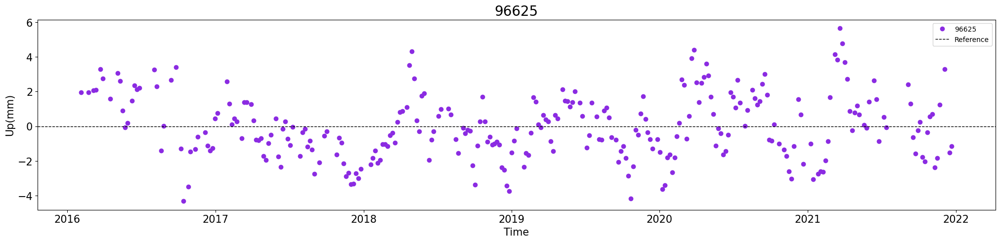

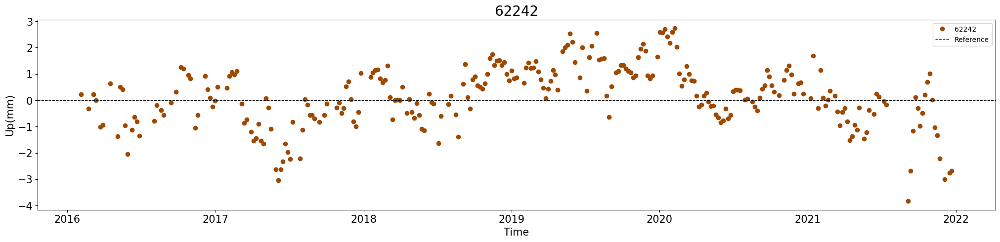

In [179]:
#checking the points plots - AFTER the reduction

colors = sns.color_palette("bright", len(points_avgrm_reduced))
folder = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files/insar_ts_plots/points_after_avg_rolling_mean/up'

for i, (column, color) in enumerate(zip(points_avgrm_reduced.columns, colors)):
    plt.figure(figsize=(25, 5))
    plt.plot(points_avgrm_reduced.index, points_avgrm_reduced[column], 'o', color=color, lw=2, label=column) 
    
    plt.title(f'{column}', fontsize = 20)
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1, label='Reference')
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize = 15)
    plt.ylabel('Up(mm)', fontsize = 15)                                       
    plt.yticks(fontsize = 15)
    #plt.ylim(-0.008,0.008)
    #plt.xlim(pd.Timestamp('2011-01-15'), pd.Timestamp('2018-07-15'))

    plt.legend()
    
    fl = os.path.join(folder, f'{column}.svg')
    f = io.BytesIO()
    plt.savefig(fl, format="svg")
    
    plt.show()

In [189]:
target_index = 62491
closest_data = teste_area_selected.loc[target_index]
print(closest_data)

KeyError: 62491